# Zero-DCE 用於低光度影像增強(low-light image enhancement)

**主要作者:** [Soumik Rakshit](http://github.com/soumik12345)<br>
**說明與修改:** [黃皓偉](https://github.com/HuangHW012/110_02_Structural-Machine-Learning-Models-and-Their-Applications)<br>
**修改時間:** 2022/06/12<br>
**Description:** 實作Zero-DCE

## 簡要說明

# **Zero-Reference Deep Curve Estimation** (**Zero-DCE**) <br>
1. 類型: Unsupervised Learning <br>
2. 特色: 使用Light-Enhancement Curve (LE-curve)方法，達到低光度影像之增強 (Image-to-Curve) <br>
3. Light-Enhancement Curve (LE-curve): $LE(I(X); \alpha)=I(x)+\alpha I(x)(1-I(x))$ <br>
4. 本論文經過修改與擴充: $LE_{n}(x)=LE_{n-1}(x)+A_{n}LE_{n-1}(x)(1-LE_{n-1}(x))$，其中$A_{n}$表示論文所設計之深度學習模型[Dce-Net]之輸出，其尺寸與輸入影像相同<br>
5. 請注意，本論文是指在輸入低光度影像之各個pixel透過LE-curve映射到高光度影像空間，並且不需要有正確答案(Ground Truth)! 

### References

- [Zero-Reference Deep Curve Estimation for Low-Light Image Enhancement](https://arxiv.org/pdf/2001.06826.pdf)
- [Curves adjustment in Adobe Photoshop](https://helpx.adobe.com/photoshop/using/curves-adjustment.html)
- [Zero-DCE for low-light image enhancement (colab)](https://colab.research.google.com/github/keras-team/keras-io/blob/master/examples/vision/ipynb/zero_dce.ipynb)

## 下載 LOLDataset

# **LoL Dataset** (paired data)<br>
1. Training set (our485): low light + high light <br>
2. Test set (eval15): low light + high light <br>

※ 請注意，訓練Zero-DCE模型不需要paired fata

In [ ]:
# 從Google雲端下載資料集
!gdown https://drive.google.com/uc?id=1DdGIJ4PZPlF2ikl8mNM9V-PdVxVLbQi6
!unzip -q lol_dataset.zip

Downloading...
From: https://drive.google.com/uc?id=1DdGIJ4PZPlF2ikl8mNM9V-PdVxVLbQi6
To: /content/lol_dataset.zip
100% 347M/347M [00:02<00:00, 124MB/s]


In [ ]:
# 匯入必要函式庫
import os
import random
import numpy as np
from glob import glob
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

## 實驗設定
1. Resize image to 256 X 256 (RGB channel) <br>
2. Preprocessing : [0, 255] -> [0, 1] <br>
3. Batch size: 8 <br>
4. Epochs : 100 <br>
5. Optimizer : Adam (learning rate = 0.0001) <br>

In [ ]:
IMAGE_SIZE = 256
BATCH_SIZE = 8
MAX_TRAIN_IMAGES = 350


def load_data(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    image = image / 255.0
    return image


def data_generator(low_light_images):
    dataset = tf.data.Dataset.from_tensor_slices((low_light_images))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

# 訓練無須高光度影像
train_low_light_images = sorted(glob("./lol_dataset/our485/low/*"))[:MAX_TRAIN_IMAGES]
val_low_light_images = sorted(glob("./lol_dataset/our485/low/*"))[MAX_TRAIN_IMAGES:]

# 測試
test_low_light_images = sorted(glob("./lol_dataset/eval15/low/*"))
test_high_light_images = sorted(glob("./lol_dataset/eval15/high/*"))

# 產生Tensorflow之資料集格式
train_dataset = data_generator(train_low_light_images)
val_dataset = data_generator(val_low_light_images)

print("Train Dataset:", train_dataset)
print("Validation Dataset:", val_dataset)

Train Dataset: <BatchDataset element_spec=TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None)>
Validation Dataset: <BatchDataset element_spec=TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None)>


## The Zero-DCE 架構

**LE-curves之性質**
1. Range of each pixel value of the enhanced image => [0,1] <br>
2. LE-curve => monotonous (to preserve the differences of neighboring pixels)<br>
3. LE-curve => simple, differentiable (in backpropagation)<br>

![](https://li-chongyi.github.io/Zero-DCE_files/framework.png)

### DCE-Net
**※目的: 產生LE-curves所需之$A_{n}$**
1. CNN-based model
2. 7層2D-Convolution <br>
3. 前6層的Output channels = 32, 最後一層的Output channels = 24 (8*3) <br>
4. 前6層的Activation是ReLU, 最後一層的Activation是tanh = 24<br>
5. Kernel size = 3 Stride = 1
![](https://i.imgur.com/HtIg34W.png)

In [ ]:
# 搭建Dce-Net
def build_dce_net():
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(input_img)
    conv2 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv1)
    conv3 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv2)
    conv4 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv3)
    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con1)
    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con2)
    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(
        int_con3
    )
    return keras.Model(inputs=input_img, outputs=x_r)


## Loss functions (Zero-Reference Loss)

##主要分成4種loss##
1. Spatial Consistency Loss ($ℒ_{spa}$) <br>
2. Exposure Control Loss ($ℒ_{exp}$) <br>
3. Color Constancy Loss ($ℒ_{col}$) <br>
4. Illumination Smoothness Loss ($ℒ_{tv_{𝒜}}$) <br>

### Spatial consistency loss

##目的: Preserving the difference of neighboring regions##
1. 保持相鄰區域的對比度 <br>
2. $ℒ_{spa}=\frac{1}{K}\sum_{i=1}^{K} \sum_{j\in\Omega(i)} (|(Y_{i}-Y_{j})|-|(I_{i}-I_{j})|)^2$

In [ ]:
# 計算Spatial consistency loss
class SpatialConsistencyLoss(tf.keras.losses.Loss):
    def __init__(self, **kwargs):
        super(SpatialConsistencyLoss, self).__init__(reduction="none")
        # 計算相鄰區域之差異，由中心減去上下左右
        self.left_kernel = tf.constant(
            [[[[0, 0, 0]], [[-1, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.right_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, -1]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.up_kernel = tf.constant(
            [[[[0, -1, 0]], [[0, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.down_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, 0]], [[0, -1, 0]]]], dtype=tf.float32
        )

    def call(self, y_true, y_pred):
        # Y是y_true, I是y_pred
        # 先算總體平均(不分RGB)
        original_mean = tf.reduce_mean(y_true, 3, keepdims=True)
        enhanced_mean = tf.reduce_mean(y_pred, 3, keepdims=True)
        # 再將影像分成[H/4, W/4]的區域
        original_pool = tf.nn.avg_pool2d(
            original_mean, ksize=4, strides=4, padding="VALID"
        )
        enhanced_pool = tf.nn.avg_pool2d(
            enhanced_mean, ksize=4, strides=4, padding="VALID"
        )
        # 計算(I_i - I_j)
        d_original_left = tf.nn.conv2d(
            original_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_right = tf.nn.conv2d(
            original_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_up = tf.nn.conv2d(
            original_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_down = tf.nn.conv2d(
            original_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        # 計算(Y_i - Y_j)
        d_enhanced_left = tf.nn.conv2d(
            enhanced_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_right = tf.nn.conv2d(
            enhanced_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_up = tf.nn.conv2d(
            enhanced_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_down = tf.nn.conv2d(
            enhanced_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )

        # 計算(|(Y_i - Y_j)| - |I_i - I_j|)^2
        d_left = tf.square(d_original_left - d_enhanced_left)
        d_right = tf.square(d_original_right - d_enhanced_right)
        d_up = tf.square(d_original_up - d_enhanced_up)
        d_down = tf.square(d_original_down - d_enhanced_down)
        # 到外面再取平均(1/M)
        return d_left + d_right + d_up + d_down

### Exposure loss

##目的: Controlling the exposure level##
1. 控制曝光度(提升亮度的關鍵要素!) <br>
2. $ℒ_{exp}=\frac{1}{M}\sum_{k=1}^{K} (|(Y_{k}-E)|)$
3. 本論文經過實驗發現E設定為0.6較佳，實際上可以在[0.6, 0.7]之內

In [ ]:
# 計算Exposure loss
def exposure_loss(x, mean_val=0.6):
    # 先算總體平均(不分RGB)
    x = tf.reduce_mean(x, axis=3, keepdims=True)
    # 再將影像分成[H/16, W/16]的區域 (nonoverlapping local regions)
    mean = tf.nn.avg_pool2d(x, ksize=16, strides=16, padding="VALID")
    return tf.reduce_mean(tf.square(mean - mean_val))

## Color constancy loss

##目的: Correcting the potential color deviations##
1. 校正顏色的離散程度(保持顏色一致) <br>
2. $ℒ_{col}=\sum_{\forall(p, q)\in\{(R,G), (R,B), (G,B)\}} (J^{p}-J^{q})^2$

In [ ]:
# 計算Color constancy loss
def color_constancy_loss(x):
    # 先計算各顏色通道的平均值
    mean_rgb = tf.reduce_mean(x, axis=(1, 2), keepdims=True)
    # 再分離RGN
    mr, mg, mb = mean_rgb[:, :, :, 0], mean_rgb[:, :, :, 1], mean_rgb[:, :, :, 2]
    d_rg = tf.square(mr - mg)
    d_rb = tf.square(mr - mb)
    d_gb = tf.square(mb - mg)
    return tf.sqrt(tf.square(d_rg) + tf.square(d_rb) + tf.square(d_gb))


## Illumination smoothness loss

##目的: Preserving the monotonicity relations between neighboring pixels##
1. 相鄰區域的pixel應具有單調性(效果: 不會看起來太[假]) <br>
2. $ℒ_{tv_{𝒜}}=\frac{1}{N}\sum_{n=1}^{N}\sum_{c\in\{R,G,B\}} (|\bigtriangledown_{x}𝒜_{n}^{c}|+|\bigtriangledown_{y}𝒜_{n}^{c}|)^2$

In [ ]:
# Illumination smoothness loss
def illumination_smoothness_loss(x):
    batch_size = tf.shape(x)[0]
    h_x = tf.shape(x)[1]
    w_x = tf.shape(x)[2]
    count_h = (tf.shape(x)[2] - 1) * tf.shape(x)[3]
    count_w = tf.shape(x)[2] * (tf.shape(x)[3] - 1)
    h_tv = tf.reduce_sum(tf.square((x[:, 1:, :, :] - x[:, : h_x - 1, :, :])))
    w_tv = tf.reduce_sum(tf.square((x[:, :, 1:, :] - x[:, :, : w_x - 1, :])))

    # 轉換到tf.float32是為了能夠計算
    batch_size = tf.cast(batch_size, dtype=tf.float32)
    count_h = tf.cast(count_h, dtype=tf.float32)
    count_w = tf.cast(count_w, dtype=tf.float32)
    return 2 * (h_tv / count_h + w_tv / count_w) / batch_size


## Fitting LE-curve using machine learning

In [ ]:
# 以TF.keras實作
class ZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super(ZeroDCE, self).__init__(**kwargs)
        # 創建前面的Dce-Net，請問注意我們目的是求出A_(n = 8)(parameter map with the same size as the given image)
        self.dce_model = build_dce_net()

    def compile(self, learning_rate, **kwargs):
        super(ZeroDCE, self).compile(**kwargs)
        # 使用Adam optimizers
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        # 由於spatial_constancy_loss是以tf.keras.losses.Loss，故在這邊亦宣告
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    # pixel經過8次疊代之LE-curve從低光度影像變成高光度影像
    def get_enhanced_image(self, data, output):
        #A_(n = 8)的最後一維有24 = 8(iterations) * 3(RGB channels) 
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        r3 = output[:, :, :, 6:9]
        r4 = output[:, :, :, 9:12]
        r5 = output[:, :, :, 12:15]
        r6 = output[:, :, :, 15:18]
        r7 = output[:, :, :, 18:21]
        r8 = output[:, :, :, 21:24]

        # 根據疊代公式可知
        x = data + r1 * (tf.square(data) - data)
        x = x + r2 * (tf.square(x) - x)
        x = x + r3 * (tf.square(x) - x)
        enhanced_image = x + r4 * (tf.square(x) - x)
        x = enhanced_image + r5 * (tf.square(enhanced_image) - enhanced_image)
        x = x + r6 * (tf.square(x) - x)
        x = x + r7 * (tf.square(x) - x)
        enhanced_image = x + r8 * (tf.square(x) - x)
        return enhanced_image

    def call(self, data):
        # 先輸出A(parameter map)
        dce_net_output = self.dce_model(data)
        # 再計算增強後的影像
        return self.get_enhanced_image(data, dce_net_output)

    # 計算Dce-Net之total loss
    def compute_losses(self, data, output):
        # 公式需要增強後之影像
        enhanced_image = self.get_enhanced_image(data, output)
        # 四種loss
        loss_spatial_constancy = tf.reduce_mean(
            self.spatial_constancy_loss(enhanced_image, data)
        )
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_illumination = 200 * illumination_smoothness_loss(output)

        # 已在前面進行加權(1, 10, 5, 200)，根據論文提供之原始程式碼(pytorch)
        total_loss = (
            loss_illumination
            + loss_spatial_constancy
            + loss_color_constancy
            + loss_exposure
        )
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    # 訓練階段
    def train_step(self, data):
        #先計算梯度 (Forward Propagation)
        with tf.GradientTape() as tape:
            output = self.dce_model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(
            losses["total_loss"], self.dce_model.trainable_weights
        )
        #再更新Dce-Net的權重 (Back Propagation)
        self.optimizer.apply_gradients(zip(gradients, self.dce_model.trainable_weights))
        return losses
    # 驗證階段
    def test_step(self, data):
        output = self.dce_model(data)
        return self.compute_losses(data, output)
    # 儲存訓練好的權重
    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        """While saving the weights, we simply save the weights of the DCE-Net"""
        self.dce_model.save_weights(
            filepath, overwrite=overwrite, save_format=save_format, options=options
        )
    # 載入訓練好的權重
    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        """While loading the weights, we simply load the weights of the DCE-Net"""
        self.dce_model.load_weights(
            filepath=filepath,
            by_name=by_name,
            skip_mismatch=skip_mismatch,
            options=options,
        )


## 訓練

In [ ]:
zero_dce_model = ZeroDCE()
zero_dce_model.compile(learning_rate=1e-4)
history = zero_dce_model.fit(train_dataset, validation_data=val_dataset, epochs=100)

# 畫出loss在不同epoch的結果
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

Epoch 1/100
43/43 [==============================] - 12s 189ms/step - total_loss: 4.6545 - illumination_smoothness_loss: 1.7213 - spatial_constancy_loss: 5.0626e-06 - exposure_loss: 2.9331 - val_total_loss: 4.3054 - val_illumination_smoothness_loss: 1.4530 - val_spatial_constancy_loss: 1.2151e-05 - val_exposure_loss: 2.8524
Epoch 2/100
43/43 [==============================] - 7s 160ms/step - total_loss: 3.7909 - illumination_smoothness_loss: 0.8851 - spatial_constancy_loss: 3.8678e-05 - exposure_loss: 2.9057 - val_total_loss: 3.6255 - val_illumination_smoothness_loss: 0.8031 - val_spatial_constancy_loss: 8.0747e-05 - val_exposure_loss: 2.8224
Epoch 3/100
43/43 [==============================] - 7s 172ms/step - total_loss: 3.4471 - illumination_smoothness_loss: 0.5671 - spatial_constancy_loss: 1.1460e-04 - exposure_loss: 2.8799 - val_total_loss: 3.3230 - val_illumination_smoothness_loss: 0.5271 - val_spatial_constancy_loss: 1.8865e-04 - val_exposure_loss: 2.7957
Epoch 4/100
43/43 [=====

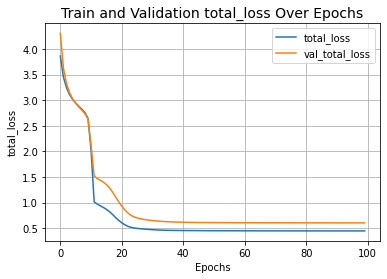

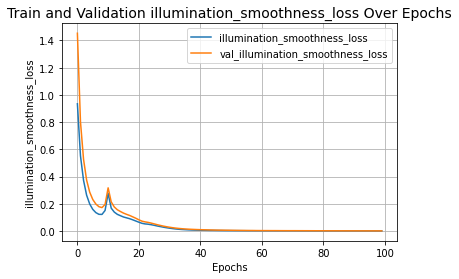

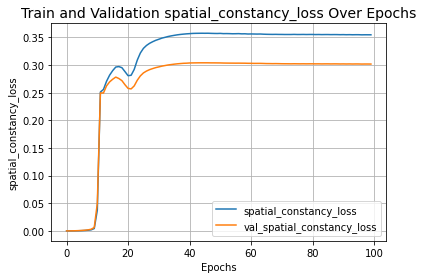

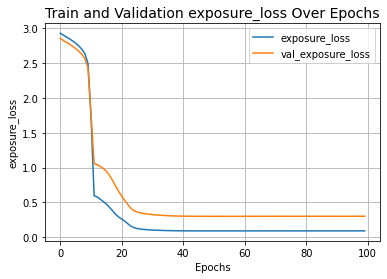

In [ ]:
plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")

In [ ]:
zero_dce_model.summary()

Model: "zero_dce"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, None, None, 24)    79416     
                                                                 
Total params: 79,416
Trainable params: 79,416
Non-trainable params: 0
_________________________________________________________________


## 預測 (inference)

In [ ]:
#畫出光線增強先後之影像
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()

# 預測影像並輸出成能夠畫出的格式
def infer(original_image):
    image = keras.preprocessing.image.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

儲存與載入模型

In [ ]:
# https://blog.goodjack.tw/2020/04/create-datetime-with-timezone-via-python3-without-pytz.html
from datetime import datetime, timezone, timedelta
# 設定為 +8 時區
#tz = timezone(timedelta(hours=+8))
#now_time = datetime.now(tz).strftime("%Y-%m-%d %H:%M:%S")
#zero_dce_model.save_weights(f"./zero-dce_trained_model/{now_time}/zero-dce_weight_{100}epoch")
#my_zerodce = ZeroDCE()
#my_zerodce.load_weights(f"./zero-dce_trained_model/{now_time}/zero-dce_weight_{100}epoch")

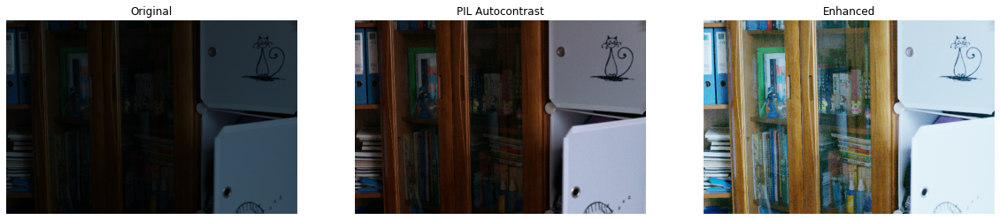

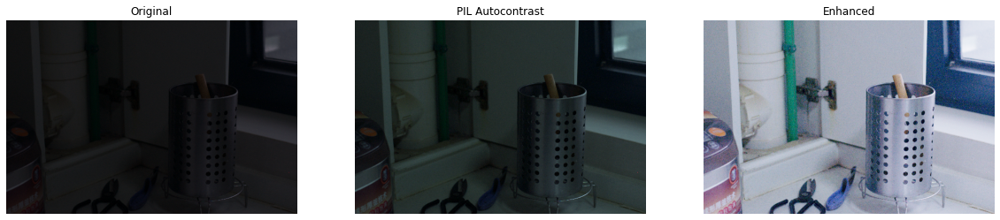

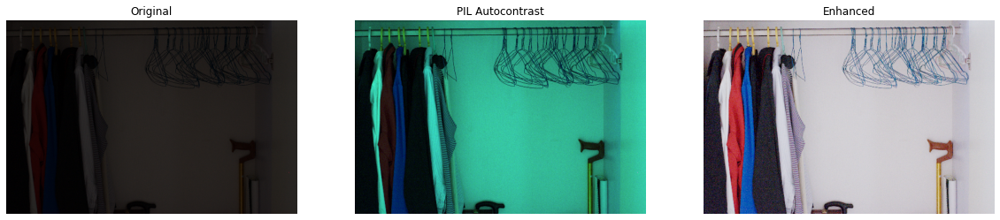

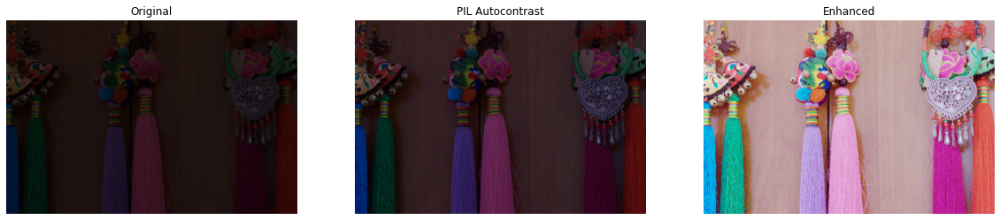

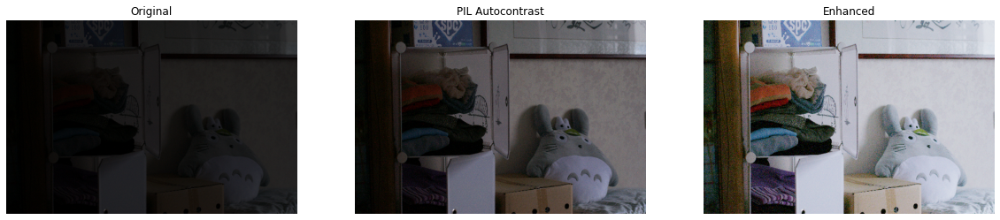

...

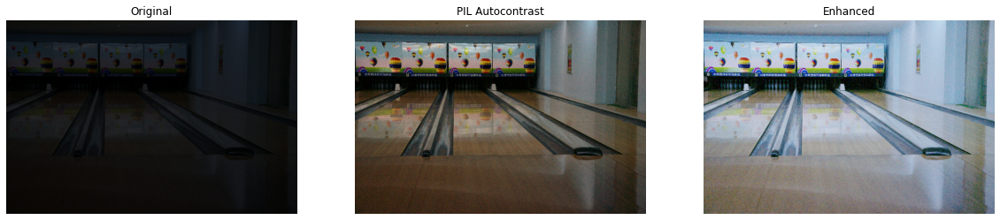

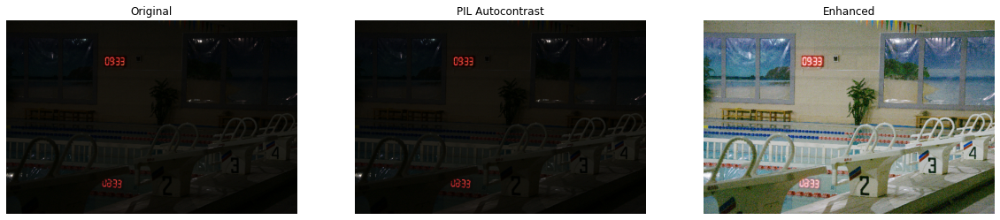

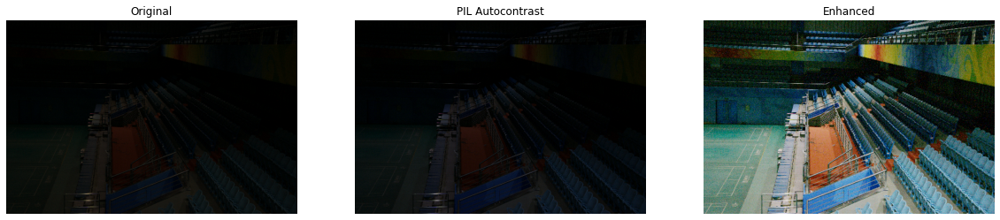

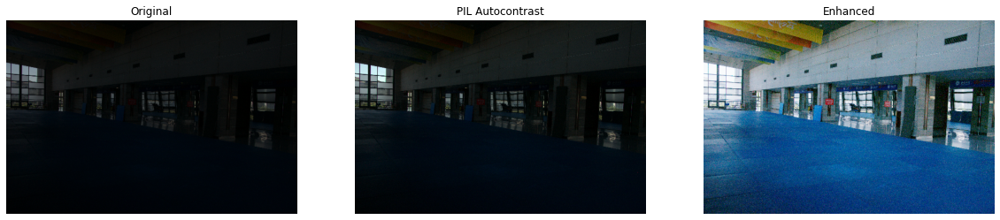

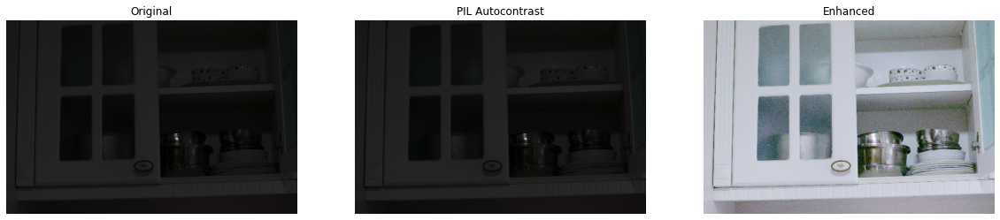

In [ ]:
def infer_mymodel(original_image):
    image = keras.preprocessing.image.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = all_zerodce(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

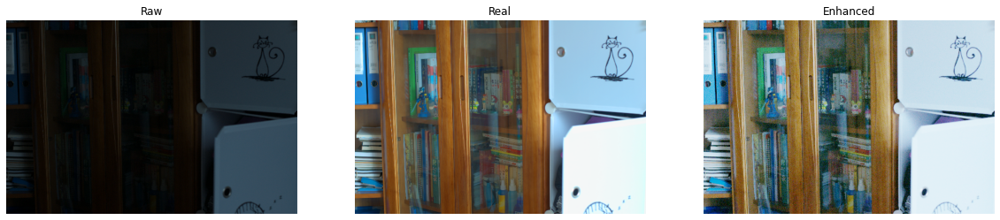

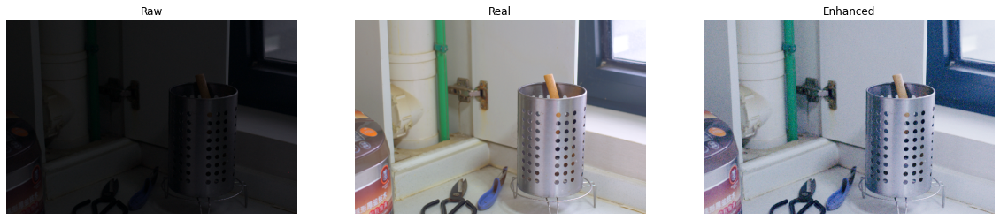

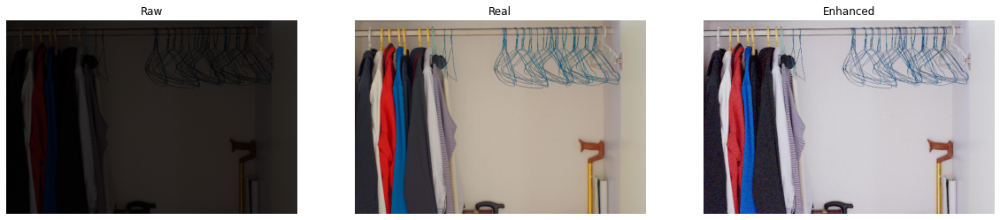

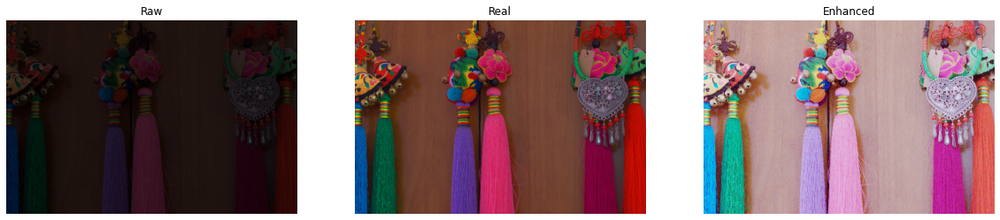

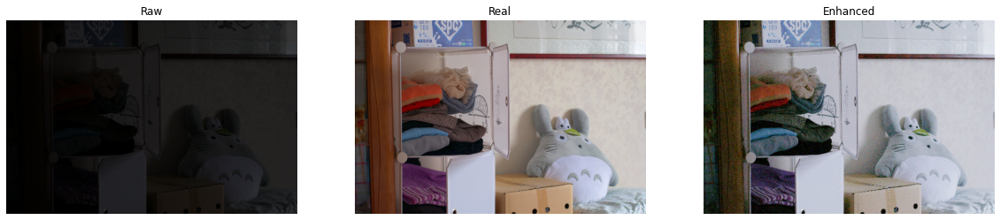

...

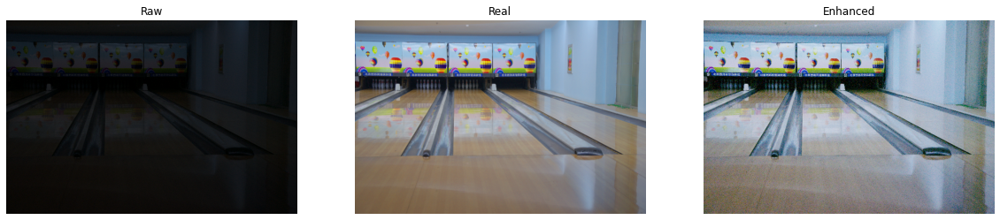

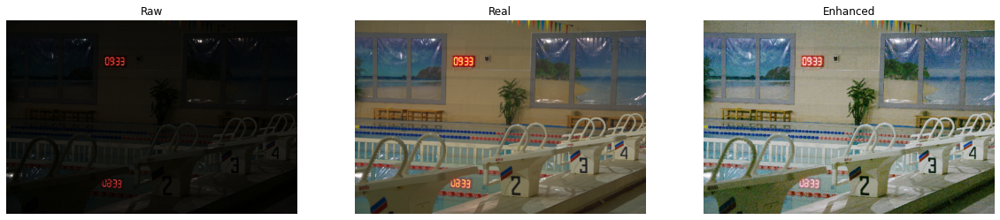

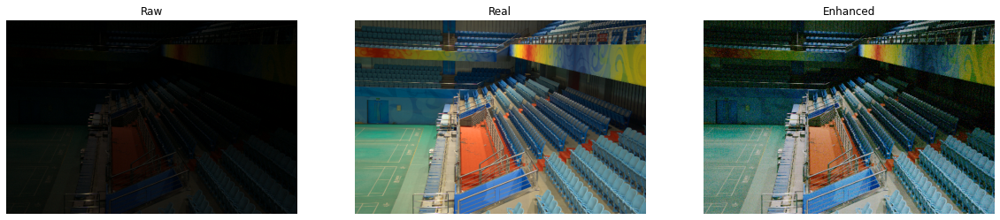

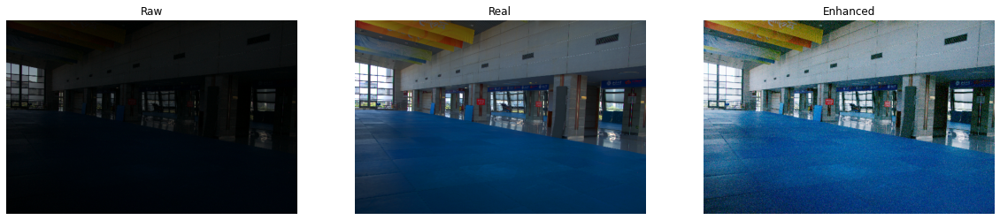

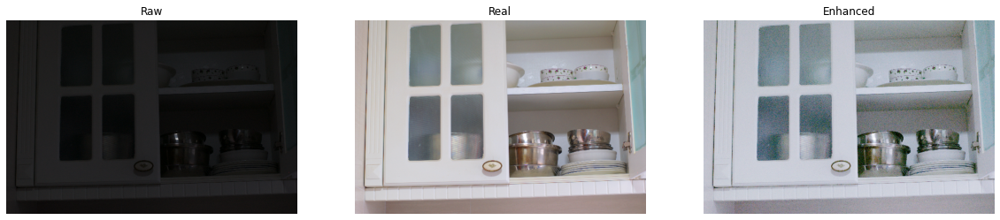

In [ ]:
# 測試
for i in range(len(test_low_light_images)):
  raw_image = Image.open(test_low_light_images[i])
  raw_image = keras.preprocessing.image.img_to_array(raw_image)
  raw_image = raw_image.astype("float32") / 255.0
  raw_image_ = np.expand_dims(raw_image, axis=0)

  enhanced_image = my_zerodce(raw_image_)
  enhanced_image = tf.cast((enhanced_image[0, :, :, :] * 255), dtype=np.uint8)
  enhanced_image = Image.fromarray(enhanced_image.numpy())

  real_image = Image.open(test_high_light_images[i])
  real_image = keras.preprocessing.image.img_to_array(real_image)
  real_image = real_image.astype("float32") / 255.0



  plot_results(
      [raw_image, real_image, enhanced_image],
      ["Raw", "Real", "Enhanced"],
      (20, 12),
  )